In [1]:
import pandas as pd
import numpy as np

import pandas as pd
import re
import string

import matplotlib.pyplot as plt
import openpyxl

import tqdm

SEED = 123456789

# **Input Data & Preprocess**

**สวรส.**

In [2]:
# input สวรส.
DATA_DIR_HRSI = "../BERTOPIC-HEALTHY-RESERCH/DATASET/hsri.xlsx"
hsri = pd.read_excel(DATA_DIR_HRSI)
hsri.info()
print('\nNull')
hsri.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5909 entries, 0 to 5908
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   index     5909 non-null   int64 
 1   itemset   5909 non-null   int64 
 2   title     1914 non-null   object
 3   names     1914 non-null   object
 4   date      1914 non-null   object
 5   abstract  1913 non-null   object
dtypes: int64(2), object(4)
memory usage: 277.1+ KB

Null


index          0
itemset        0
title       3995
names       3995
date        3995
abstract    3996
dtype: int64

In [3]:
# input bmc
DATA_DIR_BMC = "../BERTOPIC-HEALTHY-RESERCH/DATASET/bmc.xlsx"
bmc = pd.read_excel(DATA_DIR_BMC)
bmc.info()
print('\nNull')
bmc.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1461 entries, 0 to 1460
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   index     1461 non-null   int64 
 1   pages     1461 non-null   int64 
 2   title     1429 non-null   object
 3   names     1429 non-null   object
 4   date      1429 non-null   object
 5   abstract  1429 non-null   object
 6   url       1461 non-null   object
dtypes: int64(2), object(5)
memory usage: 80.0+ KB

Null


index        0
pages        0
title       32
names       32
date        32
abstract    32
url          0
dtype: int64

In [4]:
# concatenate research abstracts from 2 sources into one dataframe.
df = pd.concat([hsri,bmc]).iloc[:,2:6]
df['abstract'] = df['abstract'].astype(str).apply(openpyxl.utils.escape.unescape)
df

,title,names,date,abstract
0,NaN,NaN,NaN,nan
1,Pufferfish Poisoning,เปี่ยมศักดิ์ เมนุเศวต,2550,Pufferfish belong to two families of marine an...
2,A Study of a Refill Prescription Service Syste...,ระพีพรรณ ฉลองสุข,2550,The refilling of prescriptions for patients wi...
3,Evaluation of the Impact of Local Wisdom on Sa...,วิทยา เมฆขำ,2550,A study was carried out to evaluate the impact...
4,Looking at Health Promotion and Disease Preven...,ประคิณ สุจฉายา,2550,Children under five years old normally grow an...
...,...,...,...,...
1456,A contingent valuation study to estimate the p...,Amin Mo,24 June 2004,We used contingent valuation technique to esti...
1457,Readiness to change physical activity and diet...,Taylor Wendell C,10 June 2004,BackgroundComplementary or discrepant stages o...
1458,"""Harnessing genomics to improve health in Indi...",Acharya Tara,19 May 2004,BackgroundThe benefits of scientific medicine ...
1459,The utilisation of health research in policy-m...,Hanney Stephen R,13 January 2003,The importance of health research utilisation ...


In [5]:
df.isnull().sum()

title       4027
names       4027
date        4027
abstract       0
dtype: int64

In [6]:
# drop null
df = df.dropna()
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
Index: 3343 entries, 1 to 1460
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   title     3343 non-null   object
 1   names     3343 non-null   object
 2   date      3343 non-null   object
 3   abstract  3343 non-null   object
dtypes: object(4)
memory usage: 130.6+ KB


,title,names,date,abstract
1,Pufferfish Poisoning,เปี่ยมศักดิ์ เมนุเศวต,2550,Pufferfish belong to two families of marine an...
2,A Study of a Refill Prescription Service Syste...,ระพีพรรณ ฉลองสุข,2550,The refilling of prescriptions for patients wi...
3,Evaluation of the Impact of Local Wisdom on Sa...,วิทยา เมฆขำ,2550,A study was carried out to evaluate the impact...
4,Looking at Health Promotion and Disease Preven...,ประคิณ สุจฉายา,2550,Children under five years old normally grow an...
6,Over-crowding Problems in Hospitals,สุพัตรา ศรีวณิชชากร,2550,Overcrowding in hospitals’ out-patient sectors...


In [7]:
#word_tokenize => delete stop_words

from nltk.corpus import stopwords
import nltk
from nltk.tokenize import word_tokenize

# func. delete stopwords
def clear_stopword(sentence_list):
    return [i for i in sentence_list if i not in stopwords.words('english')]

# define all bstract to list
abstracts = []
for sentence in df['abstract'].values:
    abstracts.append(sentence.lower())

# tokenize words & delete stopwords
abstracts = [' '.join(clear_stopword(word_tokenize(i))) for i in abstracts]

# **Create Embedding Model**

In [8]:
# define device is "GPU"
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [9]:
from sentence_transformers import SentenceTransformer

# embedding abstract 
sentence_model = SentenceTransformer("all-MiniLM-L6-v2", device=device) # paraphrase-multilingual-MiniLM-L12-v2
embeddings = sentence_model.encode(abstracts, batch_size=64, show_progress_bar=True)

C:\Users\acer\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Batches: 100%|█████████████████████████████████████████████████████████████████████████| 53/53 [00:24<00:00,  2.17it/s]


In [10]:
embeddings.shape

(3343, 384)

# **Create Topic Model**

In [11]:
from umap import UMAP

# defind UMAP model 
# use UMAP to reduce dimensions of the embeddings data from kernel [10] : (3343,384) --> (3343,2)
n_neighbors = 60
min_dist = 0.1
umap_model = UMAP(n_neighbors=n_neighbors, n_components=2, min_dist=min_dist, metric='cosine',verbose=False,random_state=SEED)

In [12]:
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer

# model vectorize abstract 
vectorizer_model = CountVectorizer(token_pattern="\S+",)

# define bertopic model
topic_model = BERTopic(#embedding_model=sentence_model,
                       umap_model=umap_model,
                       vectorizer_model=vectorizer_model,
                       language='english',#"thai",
                       #representation_model=representation_model,
                       verbose=0,)
                       #min_topic_size=50)

topics, probs = topic_model.fit_transform(abstracts,embeddings)

In [13]:
# get first 10 topic
token_word = topic_model.get_topic_info()
token_word.iloc[:12,:3]

,Topic,Count,Name
0,-1,961,-1_health_study_care_system
1,0,1160,0_research_health_evidence_policy
2,1,84,1_health_primary_care_service
3,2,69,2_diabetes_diabetic_patients_blood
4,3,68,3_drug_drugs_price_pharmaceutical
5,4,65,4_cost_hospitals_hospital_per
6,5,62,5_covid19_care_people_infection
7,6,58,6_scheme_coverage_health_care
8,7,55,7_hiv_policy_research_sexual
9,8,50,8_tb_tuberculosis_patients_treatment


In [14]:
fig = topic_model.visualize_topics(width=1920, height=1080)
fig.write_html("de-topic.html")
topic_model.visualize_barchart()

# **Visualization**

In [15]:
# transform embeddings data (data from kernel [9])
project_emb_umap = umap_model.fit_transform(embeddings)

### **Visual by BERTopic**

In [16]:
topic_model.visualize_documents(abstracts, reduced_embeddings=project_emb_umap, custom_labels=True)

### **Mannual Visual**

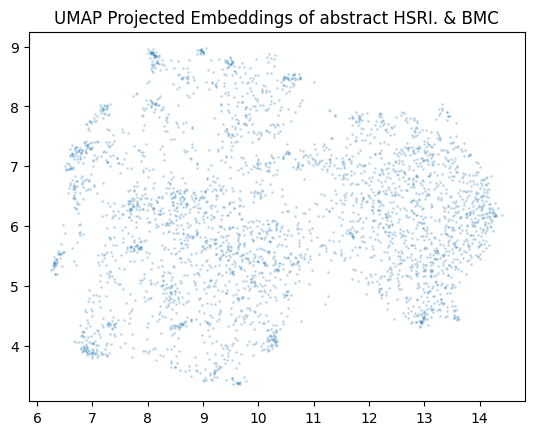

In [17]:
plt.title(f'UMAP Projected Embeddings of abstract HSRI. & BMC')
plt.scatter(project_emb_umap[:, 0], project_emb_umap[:, 1], s=1, alpha=0.2)
plt.show()

# **Visual by Wizmap**
https://github.com/poloclub/wizmap.git

In [18]:
import wizmap

xs = project_emb_umap[:,0].astype(float).tolist()
ys = project_emb_umap[:,1].astype(float).tolist()

# generate data and grid prepare before using wizmap
data_list = wizmap.generate_data_list(xs, ys, df['abstract'].values)
grid_dict = wizmap.generate_grid_dict(xs, ys, df['abstract'].values, 'abstracts of healthy system research')

# Save the JSON files
wizmap.save_json_files(data_list, grid_dict, output_dir='../BERTOPIC-HEALTHY-RESERCH/DATASET/WIZMAP_DATASET/HSRI_BMC/')

Start generating data list...
Start generating contours...
Start generating multi-level summaries...


3343it [00:00, 145406.60it/s]
100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:03<00:00,  1.70it/s]


In [20]:
from IPython.display import IFrame
"""
web demo : https://poloclub.github.io/wizmap

"""
# i store grid.json & data.ndjson in github
grid_url = 'https://raw.githubusercontent.com/Dont-HurtMe/Visualization-Topic-model/main/DATASET/DATA_WIZMAP/grid.json'
data_url = 'https://raw.githubusercontent.com/Dont-HurtMe/Visualization-Topic-model/main/DATASET/DATA_WIZMAP/data.ndjson'

# wizmap web demo 
'''
full web page : https://poloclub.github.io/wizmap/
?dataURL=https%3A%2F%2Fraw.githubusercontent.com%2FDont-HurtMe%2FVisualization-Topic-model%2Fmain%2FDATASET%2FDATA_WIZMAP%2Fdata.ndjson
&gridURL=https%3A%2F%2Fraw.githubusercontent.com%2FDont-HurtMe%2FVisualization-Topic-model%2Fmain%2FDATASET%2FDATA_WIZMAP%2Fgrid.json

'''
display_url = f'https://poloclub.github.io/wizmap/?dataURL={data_url}&gridURL={grid_url}'

# use IPython to display web demo of wizmap 
IFrame(display_url, width=1470, height=720)

In [21]:
# use wizmap func to display.
wizmap.visualize(data_url, grid_url, height=700)

<iframe
 srcdoc="<!DOCTYPE html><html lang="en"><head><meta charset="UTF-8" /><meta name="viewport" content="width=device-width, initial-scale=1.0" /><title>WizMap</title><style>html {font-size: 16px;-moz-osx-font-smoothing: grayscale;-webkit-font-smoothing: antialiased;text-rendering: optimizeLegibility;-webkit-text-size-adjust: 100%;-moz-text-size-adjust: 100%;scroll-behavior: smooth;}html, body {position: relative;width: 100%;height: 100%;overscroll-behavior: none;}body {margin: 0px;padding: 0px;box-sizing: border-box;font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Roboto, Oxygen-Sans, Ubuntu, Cantarell, 'Helvetica Neue', sans-serif;color: hsl(0, 0%, 29%);font-size: 1em;font-weight: 400;line-height: 1.5;}*, ::after, ::before {box-sizing: inherit;}a {color: rgb(0, 100, 200);text-decoration: none;}a:hover {text-decoration: underline;}a:visited {color: rgb(0, 80, 160);}label {display: block;}input, select, textarea {font-family: inherit;font-size: inherit;-webkit-padding: 0 0;padding: 0;margin: 0 0 0 0;box-sizing: border-box;border: 1px solid #ccc;border-radius: 2px;}input:disabled {color: #ccc;}button {all: unset;outline: none;cursor: pointer;}</style><script defer src='data:text/javascript;base64,dmFyIHdpem1hcD1mdW5jdGlvbigpeyJ1c2Ugc3RyaWN0Ijt2YXIgQmY9T2JqZWN0LmRlZmluZVByb3BlcnR5O3ZhciBEZj0oRWksUSx1bik9PlEgaW4gRWk/QmYoRWksUSx7ZW51bWVyYWJsZTohMCxjb25maWd1cmFibGU6ITAsd3JpdGFibGU6ITAsdmFsdWU6dW59KTpFaVtRXT11bjt2YXIgaXQ9KEVpLFEsdW4pPT4oRGYoRWksdHlwZW9mIFEhPSJzeW1ib2wiP1ErIiI6USx1biksdW4pO2Z1bmN0aW9uIEVpKCl7fWZ1bmN0aW9uIFEodCxpLGwsZSxuKXt0Ll9fc3ZlbHRlX21ldGE9e2xvYzp7ZmlsZTppLGxpbmU6bCxjb2x1bW46ZSxjaGFyOm59fX1mdW5jdGlvbiB1bih0KXtyZXR1cm4gdCgpfWZ1bmN0aW9uIHAwKCl7cmV0dXJuIE9iamVjdC5jcmVhdGUobnVsbCl9ZnVuY3Rpb24gb2UodCl7dC5mb3JFYWNoKHVuKX1mdW5jdGlvbiBoMCh0KXtyZXR1cm4gdHlwZW9mIHQ9PSJmdW5jdGlvbiJ9ZnVuY3Rpb24gZm4odCxpKXtyZXR1cm4gdCE9dD9pPT1pOnQhPT1pfHx0JiZ0eXBlb2YgdD09Im9iamVjdCJ8fHR5cGVvZiB0PT0iZnVuY3Rpb24ifWZ1bmN0aW9uIFBaKHQpe3JldHVybiBPYmplY3Qua2V5cyh0KS5sZW5ndGg9PT0wfWZ1bmN0aW9uIFowKHQsaSl7dC5hcHBlbmRDaGlsZChpKX1mdW5jdGlvbiBucyh0LGksbCl7Y29uc3QgZT1qWih0KTtpZighZS5nZXRFbGVtZW50QnlJZChpKSl7Y29uc3Qgbj1FKCJzdHlsZSIpO24uaWQ9aSxuLnRleHRDb250ZW50PWwsRlooZSxuKX19ZnVuY3Rpb24galoodCl7aWYoIXQpcmV0dXJuIGRvY3VtZW50O2NvbnN0IGk9dC5nZXRSb290Tm9kZT90LmdldFJvb3ROb2RlKCk6dC5vd25lckRvY3VtZW50O3JldHVybiBpJiZpLmhvc3Q/aTp0Lm93bmVyRG9jdW1lbnR9ZnVuY3Rpb24gRloodCxpKXtyZXR1cm4gWjAodC5oZWFkfHx0LGkpLGkuc2hlZXR9ZnVuY3Rpb24gVVoodCxpLGwpe3QuaW5zZXJ0QmVmb3JlKGksbHx8bnVsbCl9ZnVuY3Rpb24gRzAodCl7dC5wYXJlbnROb2RlLnJlbW92ZUNoaWxkKHQpfWZ1bmN0aW9uIFFaKHQsaSl7Zm9yKGxldCBsPTA7bDx0Lmxlbmd0aDtsKz0xKXRbbF0mJnRbbF0uZChpKX1mdW5jdGlvbiBFKHQpe3JldHVybiBkb2N1bWVudC5jcmVhdGVFbGVtZW50KHQpfWZ1bmN0aW9uIHlvKHQpe3JldHVybiBkb2N1bWVudC5jcmVhdGVFbGVtZW50TlMoImh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIix0KX1mdW5jdGlvbiBHbCh0KXtyZXR1cm4gZG9jdW1lbnQuY3JlYXRlVGV4dE5vZGUodCl9ZnVuY3Rpb24ganQoKXtyZXR1cm4gR2woIiAiKX1mdW5jdGlvbiBCWih0LGksbCxlKXtyZXR1cm4gdC5hZGRFdmVudExpc3RlbmVyKGksbCxlKSwoKT0+dC5yZW1vdmVFdmVudExpc3RlbmVyKGksbCxlKX1mdW5jdGlvbiBEWih0LGksbCl7bD09bnVsbD90LnJlbW92ZUF0dHJpYnV0ZShpKTp0LmdldEF0dHJpYnV0ZShpKSE9PWwmJnQuc2V0QXR0cmlidXRlKGksbCl9ZnVuY3Rpb24gRVoodCl7cmV0dXJuIEFycmF5LmZyb20odC5jaGlsZE5vZGVzKX1mdW5jdGlvbiBiZCh0LGkpe3QudmFsdWU9aT09bnVsbD8iIjppfWZ1bmN0aW9uIHBpKHQsaSxsKXt0LmNsYXNzTGlzdFtsPyJhZGQiOiJyZW1vdmUiXShpKX1mdW5jdGlvbiBPWih0LGkse2J1YmJsZXM6bD0hMSxjYW5jZWxhYmxlOmU9ITF9PXt9KXtjb25zdCBuPWRvY3VtZW50LmNyZWF0ZUV2ZW50KCJDdXN0b21FdmVudCIpO3JldHVybiBuLmluaXRDdXN0b21FdmVudCh0LGwsZSxpKSxufWxldCBkcztmdW5jdGlvbiBzcyh0KXtkcz10fWZ1bmN0aW9uIEFaKCl7aWYoIWRzKXRocm93IG5ldyBFcnJvcigiRnVuY3Rpb24gY2FsbGVkIG91dHNpZGUgY29tcG9uZW50IGluaXRpYWxpemF0aW9uIik7cmV0dXJuIGRzfWZ1bmN0aW9uIGNuKHQpe0FaKCkuJCQub25fbW91bnQucHVzaCh0KX1jb25zdCBvcz1bXSxCZT1bXSxYbz1bXSx5MD1bXSxfWj1Qcm9taXNlLnJlc29sdmUoKTtsZXQgcmM9ITE7ZnVuY3Rpb24gcVooKXtyY3x8KHJjPSEwLF9aLnRoZW4oWDApKX1mdW5jdGlvbiBwYyh0KXtYby5wdXNoKHQpfWNvbnN0IGhjPW5ldyBTZXQ7bGV0IFdvPTA7ZnVuY3Rpb24gWDAoKXtjb25zdCB0PWRzO2Rve2Zvcig7V288b3MubGVuZ3RoOyl7Y29uc3QgaT1vc1tXb1